In [5]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
#import tensorflow_datasets as tfds

In [2]:
print(tf.__version__)

2.16.1


In [6]:
import pathlib
dataset_path = "./Dataset"

archive = dataset_path
data_dir = pathlib.Path(archive).with_suffix('')

In [7]:
image_count = len(list(data_dir.glob('*/*/*.png')))
print(image_count)

4350


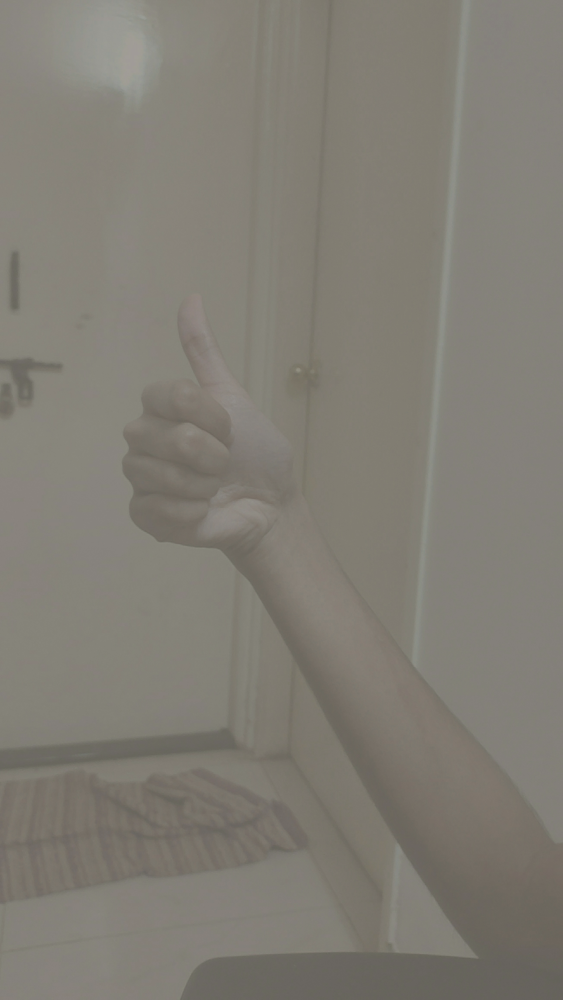

In [5]:
m = list(data_dir.glob('10_Shikara/10_Shikara/*'))
PIL.Image.open(str(m[0]))

In [8]:
batch_size = 30
img_height = 180
img_width = 180

In [9]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4350 files belonging to 29 classes.
Using 3480 files for training.


In [10]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 4350 files belonging to 29 classes.
Using 870 files for validation.


In [11]:
class_names = train_ds.class_names
print(class_names)

['10_Shikara', '11_Kapitta', '12_Katakamukhaha', '13_Soochi', '14_Chandrakala', '15_Padmakosha', '16_Sarpasheeshaha', '17_Mrughasheeha', '18_Sihamukhaha', '19_Kangoola', '1_Pataka', '20_Alapadma', '21_Chatura', '22_Bramhara', '23_Hamsasya', '24_Hamsapashakaha', '25_Shandamshu', '26_Samadamaso', '27_Mukula', '28_Tamrachooda', '29_Trishoola', '2_Tripataka', '3_Ardhapataka', '4_Kartarimukhaha', '5_Mayura', '6_Ardhachandra', '7_Arala', '8_Shukatundakaha', '9_Mushti']


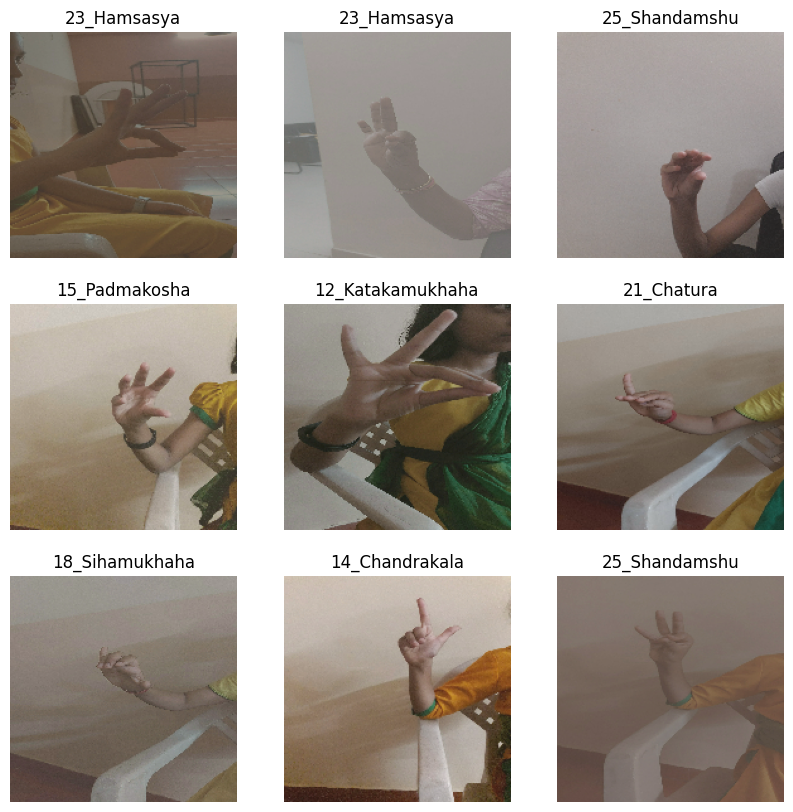

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [12]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(30, 180, 180, 3)
(30,)


In [13]:
#Normalizing the data
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [13]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.1764706 0.6392157


In [14]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [15]:
#Performing data augmentation for better results
data_augmentation = tf.keras.Sequential(
  [
    tf.keras.layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
  ]
)

C:\Python312\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [16]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

NameError: name 'plt' is not defined

In [18]:
#retraining the new model
num_classes = 29

model = tf.keras.Sequential([
    data_augmentation,
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [19]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [18]:
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=11
)

Epoch 1/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 650s 5s/step - accuracy: 0.9732 - loss: 0.1020 - val_accuracy: 0.9540 - val_loss: 0.5338
Epoch 2/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 284ms/step - accuracy: 0.9821 - loss: 0.0687 - val_accuracy: 0.9517 - val_loss: 0.6079
Epoch 3/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 288ms/step - accuracy: 0.9589 - loss: 0.1693 - val_accuracy: 0.9563 - val_loss: 0.6016
Epoch 4/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 285ms/step - accuracy: 0.9723 - loss: 0.1081 - val_accuracy: 0.9506 - val_loss: 0.5466
Epoch 5/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 286ms/step - accuracy: 0.9749 - loss: 0.0929 - val_accuracy: 0.9586 - val_loss: 0.5464
Epoch 6/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 32s 279ms/step - accuracy: 0.9746 - loss: 0.0937 - val_accuracy: 0.9437 - val_loss: 0.5734
Epoch 7/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 32s 279ms/step - accuracy: 0.9771 - loss: 0.0876 - val_accuracy: 0.9333 - val_loss: 0.7312
Epoch 8/11
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 280ms/step - accuracy: 0.9641 - loss: 0.1

In [19]:
model.save('my_model.keras')

In [17]:
model = tf.keras.models.load_model('my_model.keras')

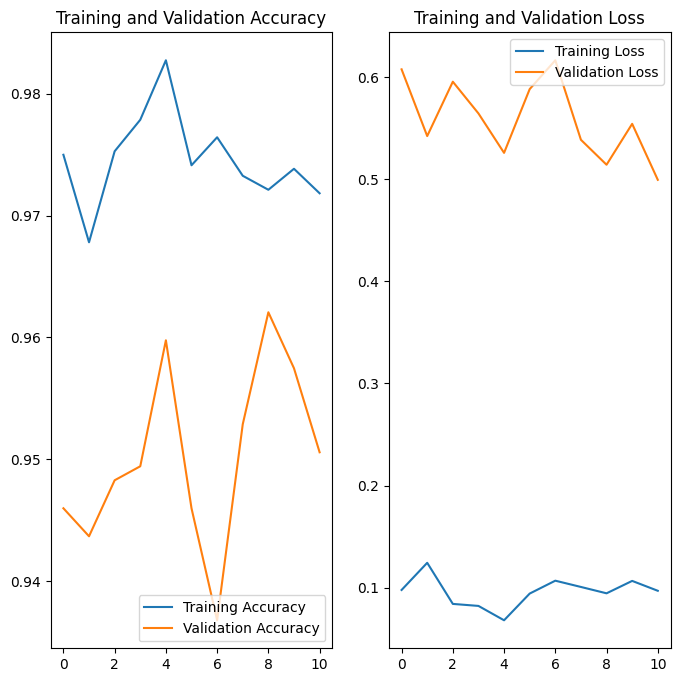

In [61]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(11)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()